In [486]:
import import_ipynb
import Helper as lib
import operator
import numpy as np

In [487]:
# First get the description data
desc_data = lib.GetDescriptionData()

In [488]:
# Then collect tag data
tag_data = lib.GetTagData()

In [489]:
# Collect all features
unsorted_train_feature_data = lib.GetFeaturesFileData('data/features_train/features_resnet1000_train.csv')
unsorted_test_feature_data = lib.GetFeaturesFileData('data/features_test/features_resnet1000_test.csv')
print(len(unsorted_train_feature_data))

10000


In [490]:
# Create train feature dictionary
unsorted_train_feature_data.sort(key=lambda x: x[0])
unsorted_test_feature_data.sort(key=lambda x: x[0])
train_feature_data = np.array(unsorted_train_feature_data)
test_feature_data = np.array(unsorted_test_feature_data)

In [491]:
print(train_feature_data[0])

['images_train/0.jpg' '-4.552913188934326' '-3.3393726348876953' ...
 '-4.325320720672607' '-1.3610081672668457' '-0.18489450216293335']


In [492]:
# Remove the extra image file name on the front
feature_data = []
for i in range(len(desc_data[0])):
    new_vector = train_feature_data[i][1:1001]
    new_vector = [float(i) for i in new_vector]
    feature_data.append(new_vector)
feature_data = np.array(feature_data)

In [493]:
# Flatten our tag data by removing all super categories, only leave sub.
new_list = []
for entry in tag_data[0]:
    new_entry = []
    if len(entry) > 0:
        for i in range(len(entry)):
            if entry[i][0] not in new_entry:
                new_entry.append(entry[i][0])
            # if entry[i][1] not in new_entry:
                # new_entry.append(entry[i][1])
    new_list.append(np.array(new_entry))
tag_data[0] = np.array(new_list)
print(tag_data[0][1])

# Flatten our test tag data by removing all super categories, only leave sub.
new_list = []
for entry in tag_data[1]:
    new_entry = []
    if len(entry) > 0:
        for i in range(len(entry)):
            if entry[i][0] not in new_entry:
                new_entry.append(entry[i][0])
            # if entry[i][1] not in new_entry:
                # new_entry.append(entry[i][1])
    new_list.append(np.array(new_entry))
tag_data[1] = np.array(new_list)
print(tag_data[1][1])

['kitchen' 'food']
['animal']


In [494]:
# Generate new tags from description and add to tags
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from string import punctuation

for i in range(len(desc_data[0])):
    word_list = []
    new_list = tag_data[0][i].tolist()
    for word in desc_data[0][i]:
        word_list.append(word)
    for word in word_list:
        if word_list.count(word) >= 3:
            if word not in new_list:
                new_list.append(word)
    tag_data[0][i] = np.array(new_list)

['animal']
Image 1



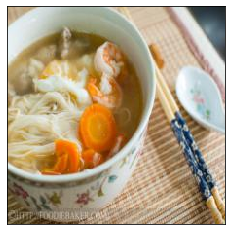

Image 1



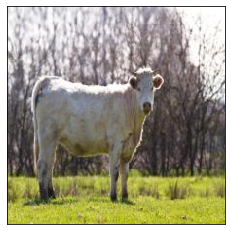

In [495]:
print(tag_data[1][1])
lib.DisplayImage(1, 'train')
lib.DisplayImage(1, 'test')

In [496]:
# Convert tags into a list of individual labels
tag_label_data = []
full_feature_data = []
indexes = []

removed_words = []

# We create a new list of feature data that corresponds one to one to each
for i in range(len(tag_data[0])):
    for word in tag_data[0][i]:
        if word not in removed_words:
            tag_label_data.append(word)
            full_feature_data.append(feature_data[i])
            indexes.append(i)

tag_label_data = np.array(tag_label_data)
full_feature_data = np.array(full_feature_data)
print(len(full_feature_data))
print(len(tag_data[0]))
print(len(tag_label_data))
print(tag_label_data[0])

52157
10000
52157
vehicle


In [497]:
# Train model to predict tag from feature data
from sklearn import naive_bayes as nb
print(feature_data.shape)
print(tag_label_data[2])
clf = nb.GaussianNB()
clf.fit(full_feature_data, tag_label_data)

(10000, 1000)
sports


GaussianNB(priors=None, var_smoothing=1e-09)

Correct image:
Correct tags:['outdoor' 'sign' 'traffic' 'light' 'juice']
Image 1000



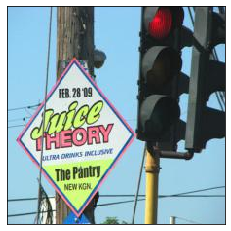

['dock']


In [498]:
# Try predicting with GaussianNaiveBayes
target_index = 1000
target = full_feature_data[target_index].reshape(1,-1)
guess = clf.predict(target)
print('Correct image:')
print('Correct tags:' + str(tag_data[0][target_index]))
lib.DisplayImage(target_index, 'train')
print(guess)

In [499]:
# Create knn model for training descriptions
from sklearn.neighbors import KNeighborsClassifier

knn_classifier = KNeighborsClassifier(n_neighbors=17)
knn_classifier.fit(full_feature_data, tag_label_data)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=17, p=2,
           weights='uniform')

Correct image:
Correct tags:['person' 'outdoor' 'sports' 'vehicle' 'young' 'boy' 'throw' 'frisbee'
 'park']
Image 3



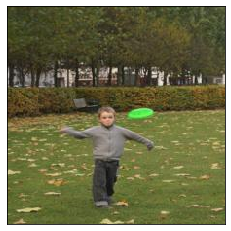

['outdoor']


In [500]:
# Try predicting category with kNN model
target_index = 3
target = full_feature_data[target_index].reshape(1,-1)
guess = knn_classifier.predict(target)
print('Correct image:')
print('Correct tags:' + str(tag_data[0][target_index]))
lib.DisplayImage(target_index, 'train')
print(guess)

In [501]:
# Check how well we do over 100 images
def CheckAccuracy(model, size, data = [], tag_data = [], index_list = []):
    correct = 0
    for i in range(size):
        target = data[i].reshape(1,-1)
        guess = model.predict(target)
        # print(guess)
        # print(tag_data[0][i])
        if guess in tag_data[i]:
            correct += 1
        print('Image ID:' + str(i))
        print('Incorrect tag: ' + str(guess))
        print('Actual tags: ' + str(tag_data[i]))
        lib.DisplayImage(i, 'train')
    print(correct/size)

Image ID:0
Incorrect tag: ['accessory']
Actual tags: ['vehicle' 'outdoor' 'sports' 'person' 'accessory' 'furniture' 'picnic'
 'table']
Image 0



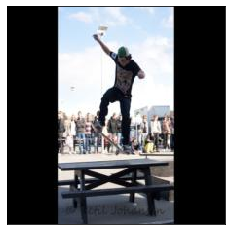

Image ID:1
Incorrect tag: ['bowl']
Actual tags: ['kitchen' 'food' 'bowl' 'soup' 'carrots' 'shrimp']
Image 1



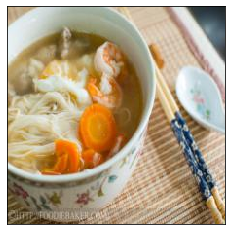

Image ID:2
Incorrect tag: ['person']
Actual tags: ['vehicle' 'outdoor' 'person' 'man' 'walk' 'truck']
Image 2



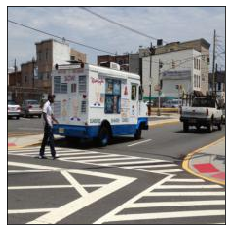

Image ID:3
Incorrect tag: ['person']
Actual tags: ['person' 'outdoor' 'sports' 'vehicle' 'young' 'boy' 'throw' 'frisbee'
 'park']
Image 3



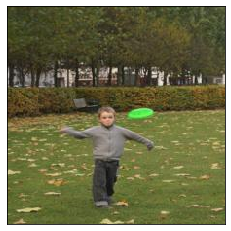

Image ID:4
Incorrect tag: ['person']
Actual tags: ['person' 'sports' 'yard' 'bat' 'boy' 'baseball']
Image 4



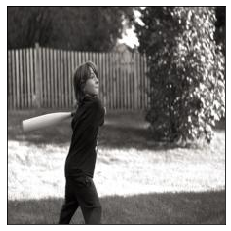

Image ID:5
Incorrect tag: ['indoor']
Actual tags: ['furniture' 'electronic' 'indoor' 'kitchen' 'bedroom' 'desk' 'chair']
Image 5



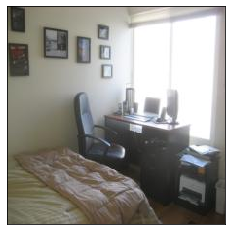

Image ID:6
Incorrect tag: ['person']
Actual tags: ['person' 'food' 'vehicle' 'eat' 'donut' 'boy' 'sugar']
Image 6



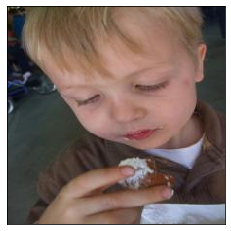

Image ID:7
Incorrect tag: ['person']
Actual tags: ['person' 'accessory' 'man' 'wear']
Image 7



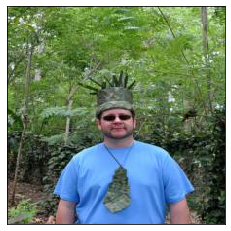

Image ID:8
Incorrect tag: ['person']
Actual tags: ['vehicle' 'person' 'street' 'build']
Image 8



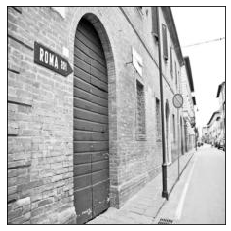

Image ID:9
Incorrect tag: ['accessory']
Actual tags: ['vehicle' 'accessory' 'tent']
Image 9



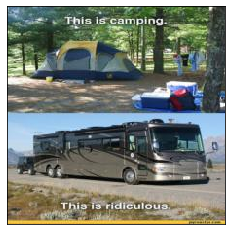

Image ID:10
Incorrect tag: ['accessory']
Actual tags: ['accessory' 'luggage' 'rug' 'floor']
Image 10



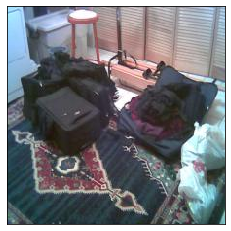

Image ID:11
Incorrect tag: ['person']
Actual tags: ['person' 'sports' 'baseball' 'player']
Image 11



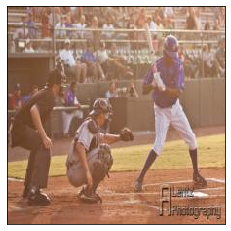

Image ID:12
Incorrect tag: ['accessory']
Actual tags: ['four' 'sign']
Image 12



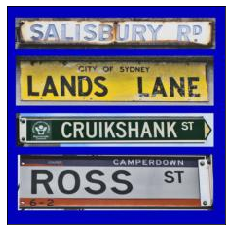

Image ID:13
Incorrect tag: ['animal']
Actual tags: ['outdoor' 'sports' 'person' 'baseball']
Image 13



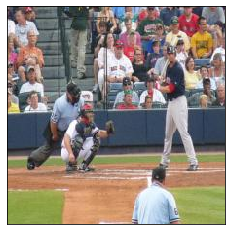

Image ID:14
Incorrect tag: ['vehicle']
Actual tags: ['vehicle' 'outdoor' 'car' 'drive' 'tunnel' 'street']
Image 14



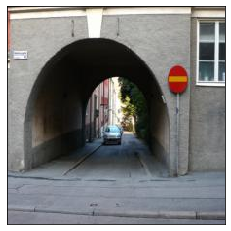

Image ID:15
Incorrect tag: ['bottle']
Actual tags: ['kitchen' 'person' 'furniture' 'people' 'stand' 'table' 'wine' 'bottle']
Image 15



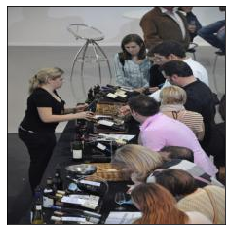

Image ID:16
Incorrect tag: ['person']
Actual tags: ['indoor' 'person' 'accessory' 'vehicle' 'school' 'build' 'walk']
Image 16



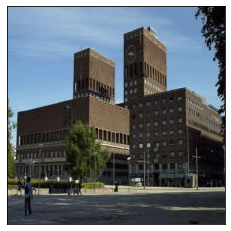

Image ID:17
Incorrect tag: ['animal']
Actual tags: ['person' 'sports' 'image']
Image 17



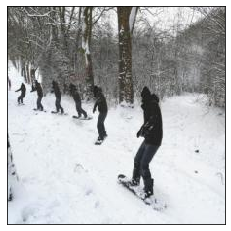

Image ID:18
Incorrect tag: ['person']
Actual tags: ['furniture' 'person' 'kitchen' 'food' 'group' 'kid' 'table' 'around'
 'cake']
Image 18



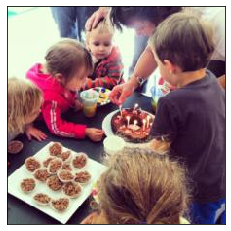

Image ID:19
Incorrect tag: ['furniture']
Actual tags: ['vehicle' 'furniture' 'train' 'station']
Image 19



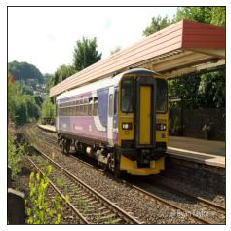

Image ID:20
Incorrect tag: ['accessory']
Actual tags: ['electronic' 'animal' 'cat']
Image 20



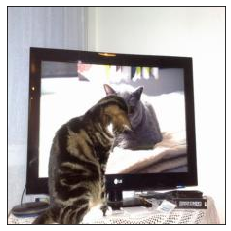

Image ID:21
Incorrect tag: ['vehicle']
Actual tags: ['indoor' 'vehicle' 'clock']
Image 21



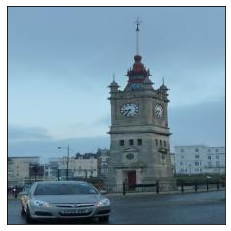

Image ID:22
Incorrect tag: ['animal']
Actual tags: ['animal' 'two' 'giraffes' 'stand']
Image 22



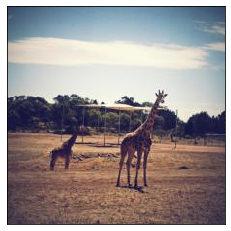

Image ID:23
Incorrect tag: ['accessory']
Actual tags: ['person' 'sports' 'snowboarder']
Image 23



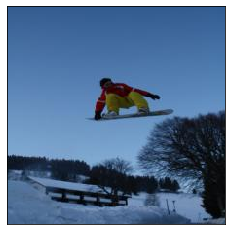

Image ID:24
Incorrect tag: ['cars']
Actual tags: ['vehicle' 'outdoor' 'cars' 'church']
Image 24



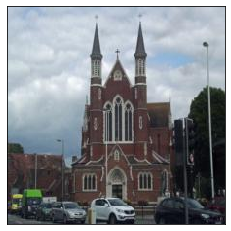

Image ID:25
Incorrect tag: ['animal']
Actual tags: ['animal' 'vehicle' 'small' 'bird']
Image 25



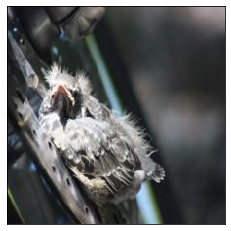

Image ID:26
Incorrect tag: ['vehicle']
Actual tags: ['animal' 'vehicle' 'person' 'dog' 'street' 'bicycle']
Image 26



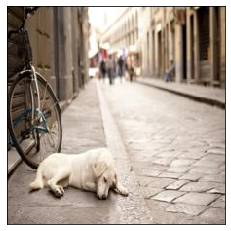

Image ID:27
Incorrect tag: ['person']
Actual tags: ['person' 'sports' 'rid' 'wave']
Image 27



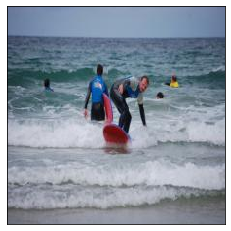

Image ID:28
Incorrect tag: ['vehicle']
Actual tags: ['electronic' 'indoor' 'computer']
Image 28



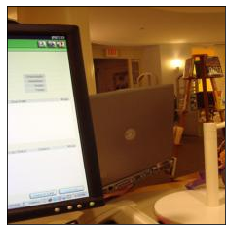

Image ID:29
Incorrect tag: ['animal']
Actual tags: ['vehicle' 'bike']
Image 29



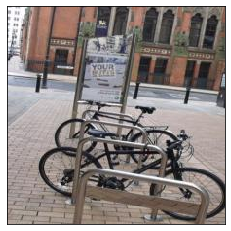

Image ID:30
Incorrect tag: ['person']
Actual tags: ['sports' 'outdoor' 'person' 'play' 'soccer' 'girls']
Image 30



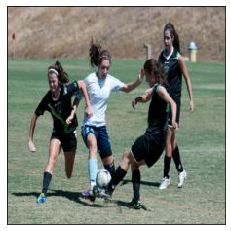

Image ID:31
Incorrect tag: ['bear']
Actual tags: ['indoor' 'stuff' 'pedal' 'bear' 'gas']
Image 31



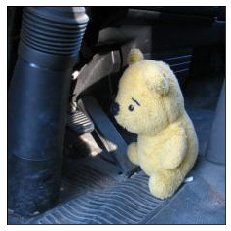

Image ID:32
Incorrect tag: ['kitchen']
Actual tags: ['electronic' 'person' 'kitchen' 'talk' 'phone' 'woman' 'cell']
Image 32



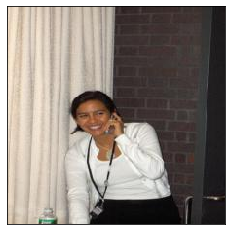

Image ID:33
Incorrect tag: ['animal']
Actual tags: ['animal' 'dog']
Image 33



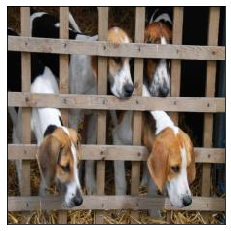

Image ID:34
Incorrect tag: ['person']
Actual tags: ['sports' 'person' 'woman' 'tennis' 'ball']
Image 34



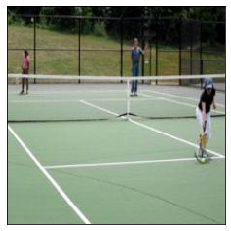

Image ID:35
Incorrect tag: ['doll']
Actual tags: ['kitchen' 'food' 'grapes']
Image 35



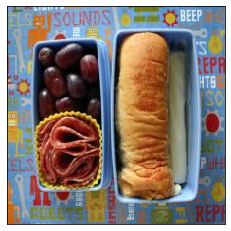

Image ID:36
Incorrect tag: ['furniture']
Actual tags: ['vehicle' 'person' 'furniture' 'motorcycle' 'cars']
Image 36



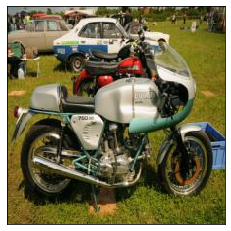

Image ID:37
Incorrect tag: ['animal']
Actual tags: ['appliance' 'kitchen']
Image 37



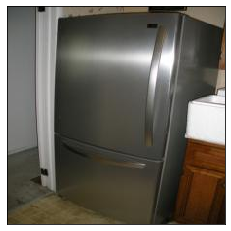

Image ID:38
Incorrect tag: ['cell']
Actual tags: ['indoor' 'tower' 'clock']
Image 38



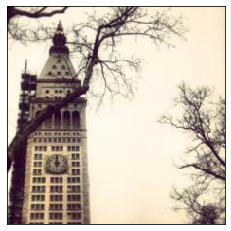

Image ID:39
Incorrect tag: ['animal']
Actual tags: ['furniture' 'indoor' 'red' 'yellow' 'tulips' 'vase' 'table']
Image 39



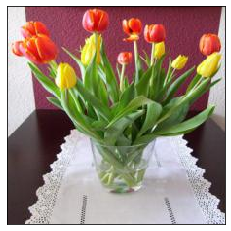

Image ID:40
Incorrect tag: ['sports']
Actual tags: ['person' 'sports' 'accessory' 'surf' 'board' 'beach' 'near']
Image 40



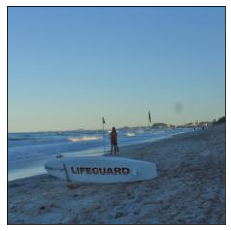

Image ID:41
Incorrect tag: ['person']
Actual tags: ['animal' 'person' 'girl' 'rid' 'horse']
Image 41



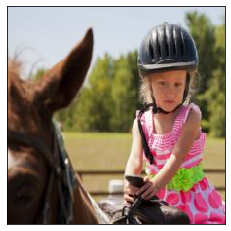

Image ID:42
Incorrect tag: ['furniture']
Actual tags: ['furniture' 'indoor' 'bed' 'dresser']
Image 42



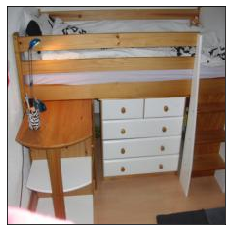

Image ID:43
Incorrect tag: ['person']
Actual tags: ['animal' 'outdoor' 'bird' 'stand']
Image 43



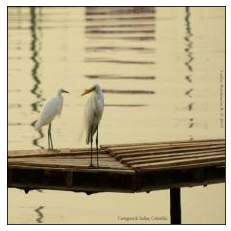

Image ID:44
Incorrect tag: ['animal']
Actual tags: ['person' 'animal' 'two' 'giraffe']
Image 44



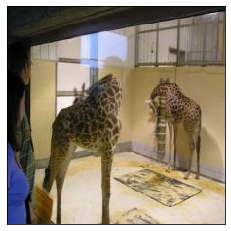

Image ID:45
Incorrect tag: ['appliance']
Actual tags: ['furniture' 'electronic' 'person' 'appliance' 'indoor' 'woman' 'stand'
 'table']
Image 45



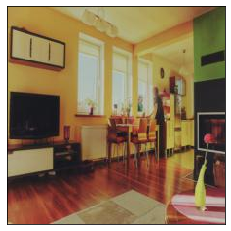

Image ID:46
Incorrect tag: ['bathroom']
Actual tags: ['shower' 'glass' 'bathroom']
Image 46



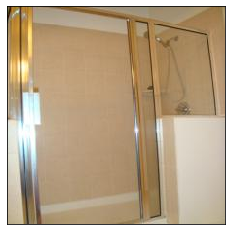

Image ID:47
Incorrect tag: ['accessory']
Actual tags: ['animal' 'bird' 'perch' 'tree']
Image 47



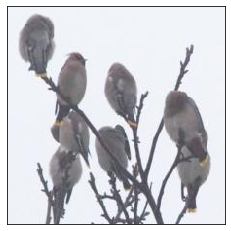

Image ID:48
Incorrect tag: ['person']
Actual tags: ['person' 'outdoor' 'bench' 'sit' 'two' 'children']
Image 48



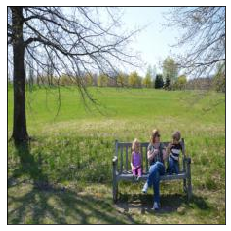

Image ID:49
Incorrect tag: ['accessory']
Actual tags: ['vehicle' 'person' 'outdoor' 'accessory' 'bench' 'woman' 'sit']
Image 49



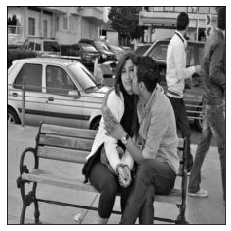

Image ID:50
Incorrect tag: ['person']
Actual tags: ['accessory' 'person' 'woman' 'tie' 'hair' 'purple' 'wear' 'shirt']
Image 50



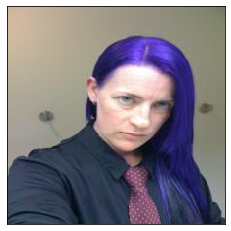

Image ID:51
Incorrect tag: ['accessory']
Actual tags: ['vehicle' 'person' 'accessory' 'bus' 'park']
Image 51



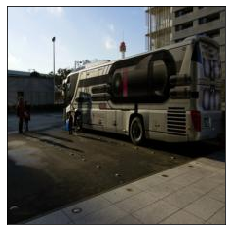

Image ID:52
Incorrect tag: ['accessory']
Actual tags: ['kitchen' 'appliance' 'furniture' 'small' 'ceiling']
Image 52



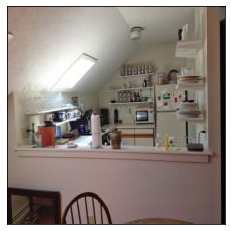

Image ID:53
Incorrect tag: ['accessory']
Actual tags: ['electronic' 'person' 'accessory' 'mouse' 'laptop' 'type']
Image 53



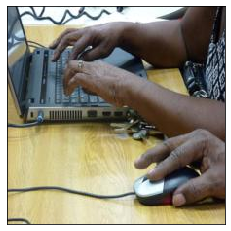

Image ID:54
Incorrect tag: ['man']
Actual tags: ['kitchen' 'furniture' 'person' 'electronic' 'man' 'laptop' 'desk' 'sit']
Image 54



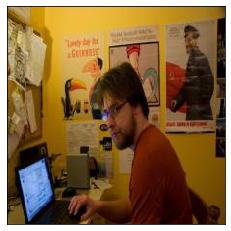

Image ID:55
Incorrect tag: ['cell']
Actual tags: ['electronic' 'person' 'baby' 'sit' 'hold' 'cell' 'phone']
Image 55



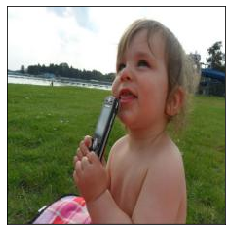

Image ID:56
Incorrect tag: ['person']
Actual tags: ['animal' 'giraffe' 'ostrich']
Image 56



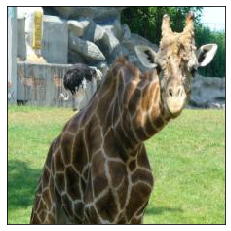

Image ID:57
Incorrect tag: ['animal']
Actual tags: ['food' 'kitchen' 'bowl' 'white' 'broccoli']
Image 57



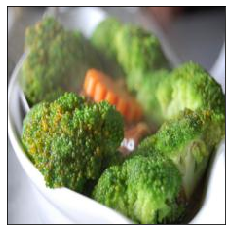

Image ID:58
Incorrect tag: ['person']
Actual tags: ['person' 'hat' 'head']
Image 58



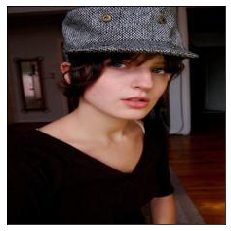

Image ID:59
Incorrect tag: ['baseball']
Actual tags: ['person' 'sports' 'baseball' 'player' 'plate']
Image 59



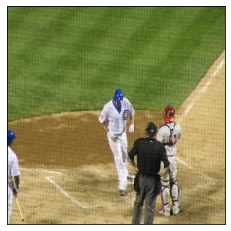

Image ID:60
Incorrect tag: ['vehicle']
Actual tags: ['vehicle' 'plane' 'fly' 'blue' 'sky']
Image 60



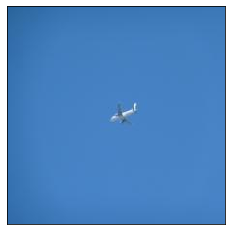

Image ID:61
Incorrect tag: ['person']
Actual tags: ['vehicle' 'person' 'train' 'graffiti']
Image 61



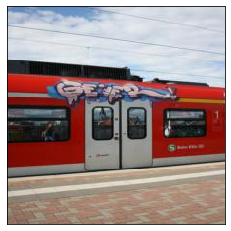

Image ID:62
Incorrect tag: ['boat']
Actual tags: ['kitchen' 'food' 'furniture' 'table' 'carrots' 'peas' 'salad' 'bread']
Image 62



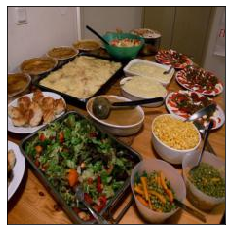

Image ID:63
Incorrect tag: ['animal']
Actual tags: ['animal' 'dog' 'sit' 'car' 'husky' 'front' 'seat']
Image 63



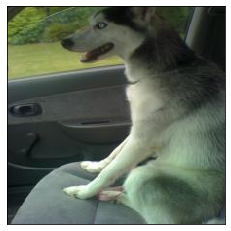

Image ID:64
Incorrect tag: ['bear']
Actual tags: ['outdoor' 'bench' 'white' 'flower']
Image 64



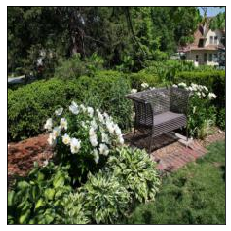

Image ID:65
Incorrect tag: ['accessory']
Actual tags: ['person' 'food' 'electronic' 'accessory' 'bakery']
Image 65



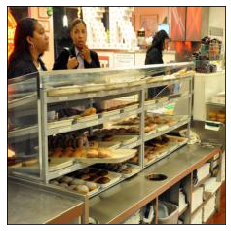

Image ID:66
Incorrect tag: ['accessory']
Actual tags: ['furniture' 'accessory' 'luggage']
Image 66



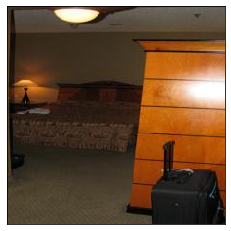

Image ID:67
Incorrect tag: ['animal']
Actual tags: ['animal' 'two' 'giraffes' 'neck' 'cross']
Image 67



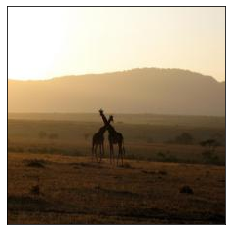

Image ID:68
Incorrect tag: ['accessory']
Actual tags: ['sports' 'person' 'accessory' 'baseball' 'child']
Image 68



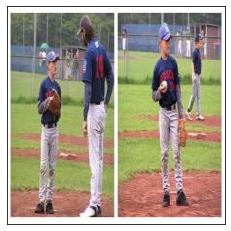

Image ID:69
Incorrect tag: ['person']
Actual tags: ['kitchen' 'electronic' 'furniture' 'person' 'accessory' 'group' 'table'
 'drink']
Image 69



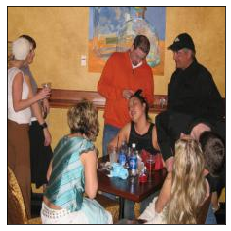

Image ID:70
Incorrect tag: ['person']
Actual tags: ['person' 'kitchen' 'food']
Image 70



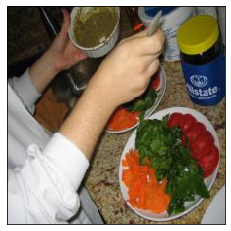

Image ID:71
Incorrect tag: ['tree']
Actual tags: ['outdoor' 'fire' 'hydrant' 'red' 'tree']
Image 71



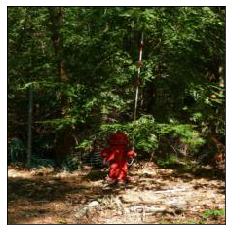

Image ID:72
Incorrect tag: ['bed']
Actual tags: ['indoor' 'vehicle' 'outdoor' 'furniture' 'vase' 'flower' 'table' 'pink']
Image 72



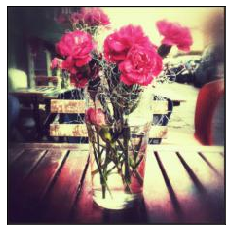

Image ID:73
Incorrect tag: ['accessory']
Actual tags: ['accessory' 'outdoor' 'person' 'man' 'blue' 'umbrella' 'street']
Image 73



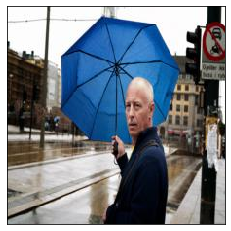

Image ID:74
Incorrect tag: ['animal']
Actual tags: ['vehicle' 'view' 'train' 'track']
Image 74



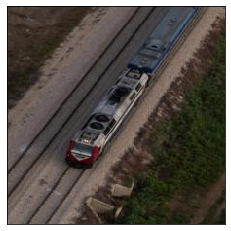

Image ID:75
Incorrect tag: ['accessory']
Actual tags: ['animal' 'accessory' 'cat' 'lay' 'top' 'black']
Image 75



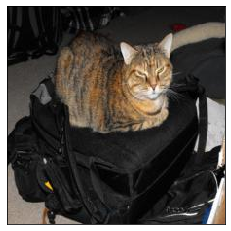

Image ID:76
Incorrect tag: ['accessory']
Actual tags: ['accessory' 'furniture' 'umbrellas' 'hang' 'ceiling' 'flower']
Image 76



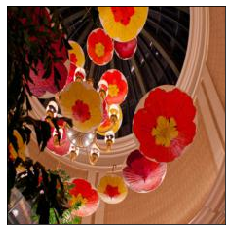

Image ID:77
Incorrect tag: ['person']
Actual tags: ['kitchen' 'furniture' 'person' 'electronic' 'accessory' 'man' 'game'
 'people' 'video']
Image 77



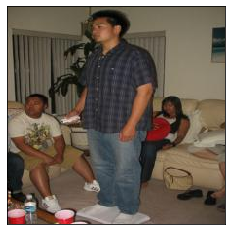

Image ID:78
Incorrect tag: ['furniture']
Actual tags: ['furniture' 'white' 'bathroom' 'toilet' 'paper']
Image 78



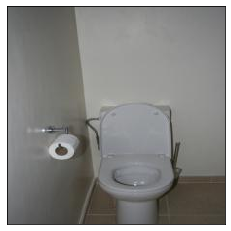

Image ID:79
Incorrect tag: ['furniture']
Actual tags: ['vehicle' 'person' 'outdoor' 'furniture' 'bus' 'ad' 'double' 'decker']
Image 79



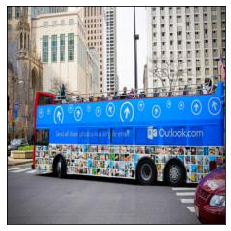

Image ID:80
Incorrect tag: ['person']
Actual tags: ['person' 'food' 'kitchen' 'ice' 'doughnuts']
Image 80



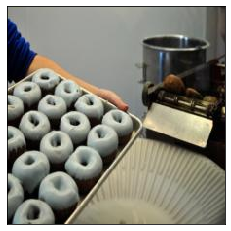

Image ID:81
Incorrect tag: ['accessory']
Actual tags: ['accessory' 'person' 'man' 'tie' 'show']
Image 81



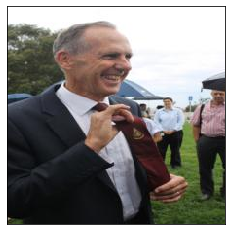

Image ID:82
Incorrect tag: ['animal']
Actual tags: ['appliance' 'white' 'sink' 'mirror' 'light' 'bathroom']
Image 82



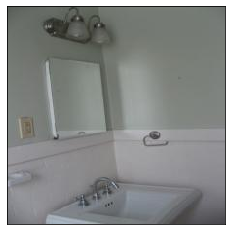

Image ID:83
Incorrect tag: ['vehicle']
Actual tags: ['animal' 'vehicle' 'person' 'motorcycle' 'park' 'street' 'city']
Image 83



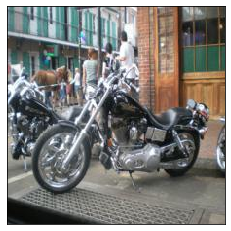

Image ID:84
Incorrect tag: ['animal']
Actual tags: ['animal' 'furniture' 'cat' 'top' 'chair' 'cover' 'hair']
Image 84



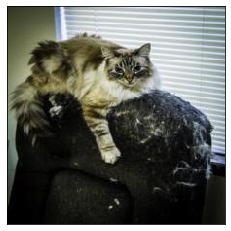

Image ID:85
Incorrect tag: ['animal']
Actual tags: ['animal' 'rack' 'shoe' 'dog']
Image 85



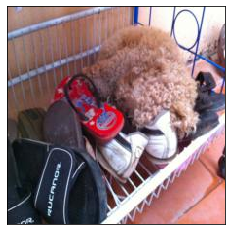

Image ID:86
Incorrect tag: ['person']
Actual tags: ['outdoor' 'accessory' 'vehicle' 'person' 'people' 'near']
Image 86



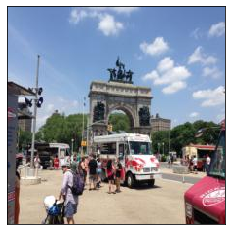

Image ID:87
Incorrect tag: ['furniture']
Actual tags: ['person' 'kitchen' 'food' 'furniture' 'table' 'cake' 'kid']
Image 87



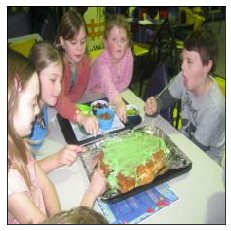

Image ID:88
Incorrect tag: ['person']
Actual tags: ['vehicle' 'person' 'train']
Image 88



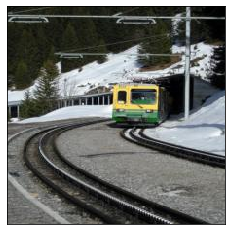

Image ID:89
Incorrect tag: ['accessory']
Actual tags: ['indoor' 'person' 'accessory' 'build' 'people' 'clock']
Image 89



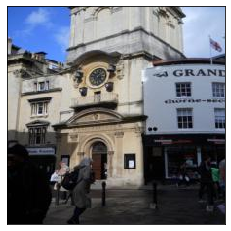

Image ID:90
Incorrect tag: ['furniture']
Actual tags: ['kitchen' 'furniture' 'person' 'food' 'group' 'people' 'sit' 'table']
Image 90



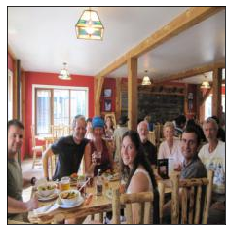

Image ID:91
Incorrect tag: ['person']
Actual tags: ['animal' 'vehicle' 'person' 'boat' 'harbor' 'dock']
Image 91



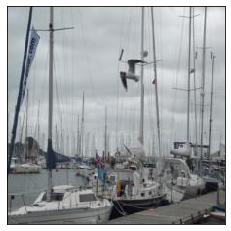

Image ID:92
Incorrect tag: ['bird']
Actual tags: ['kitchen' 'furniture' 'bottle' 'wine' 'next' 'glass' 'table']
Image 92



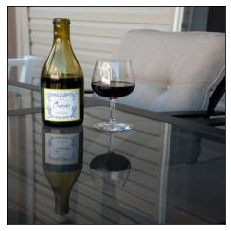

Image ID:93
Incorrect tag: ['animal']
Actual tags: ['animal' 'bear' 'brown']
Image 93



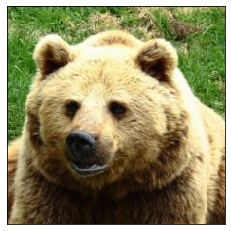

Image ID:94
Incorrect tag: ['person']
Actual tags: ['animal' 'field']
Image 94



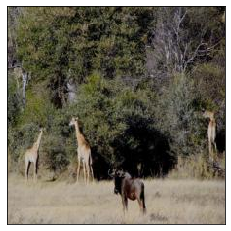

Image ID:95
Incorrect tag: ['person']
Actual tags: ['vehicle' 'person' 'indoor' 'side' 'build' 'clock']
Image 95



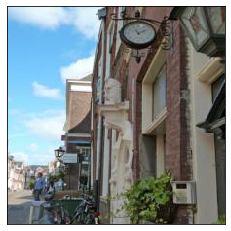

Image ID:96
Incorrect tag: ['appliance']
Actual tags: ['person' 'kitchen' 'appliance' 'indoor' 'man' 'pot' 'pan']
Image 96



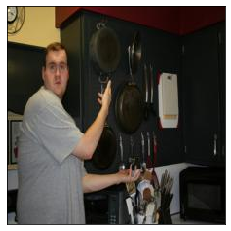

Image ID:97
Incorrect tag: ['people']
Actual tags: ['kitchen' 'person' 'indoor' 'furniture' 'people' 'table' 'sit' 'soup']
Image 97



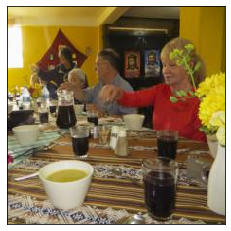

Image ID:98
Incorrect tag: ['appliance']
Actual tags: ['kitchen' 'furniture' 'appliance' 'bathroom' 'toilet' 'bath' 'tub']
Image 98



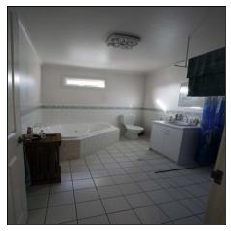

Image ID:99
Incorrect tag: ['chair']
Actual tags: ['person' 'sports' 'skateboarder' 'rail' 'rid' 'skateboard']
Image 99



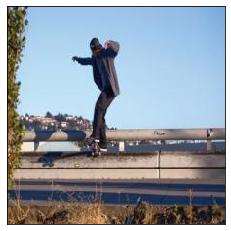

0.76


In [502]:
knn_classifier = KNeighborsClassifier(n_neighbors=11)
knn_classifier.fit(full_feature_data, tag_label_data)
CheckAccuracy(knn_classifier, 100, feature_data, tag_data[0], indexes)

In [503]:
# Use the kNN classifier on test data and print out images
# First process test features
# Remove the extra image file name on the front
test_full_feature_data = []
for i in range(len(desc_data[1])):
    new_vector = test_feature_data[i][1:1001]
    new_vector = [float(i) for i in new_vector]
    test_full_feature_data.append(new_vector)
test_full_feature_data = np.array(feature_data)

#Test indexes

In [598]:
# Check how well we do over 100 images
def CheckTestAccuracy(model, size, data = []):
    # correct = 0
    guesses = []
    for i in range(size):
        if i % 50 == 0:
            print('Guess Progress: ' + str(i) + '/' + str(2000))
        target = data[i].reshape(1,-1)
        guess = model.predict(target)
        # print(guess)
        # if guess in tag_data[i]:
        #    correct += 1
        # print('Image ID:' + str(i))
        # print('Incorrect tag: ' + str(guess))
        # print('Actual tags: ' + str(tag_data[i]))
        # lib.DisplayImage(i, 'test')
        guesses.append(guess)
    # print(correct/size)
    return guesses

In [526]:
# print(full_feature_data[0])
knn_classifier = KNeighborsClassifier(n_neighbors=13)
knn_classifier.fit(full_feature_data, tag_label_data)
guesses = CheckTestAccuracy(knn_classifier, 100, test_full_feature_data)

In [611]:
# Function that extracts pictures with a given tag
def GetImagesWithTag(tag = str, data = []):
    image_indexes = []
    for i in range(len(data)):
        for word in data[i]:
            if word == tag:
                image_indexes.append(i)
                break
    counter = 0
    
    # Sometimes we get less than 20 candidates, in that case just add from 0 until we have 20, checking if we have duplicates
    while(len(image_indexes) < 20):
        if counter not in image_indexes:
            image_indexes.append(counter)
        counter += 1    
    return image_indexes

In [565]:
candidates = GetImagesWithTag('animal')

In [580]:
print(len(candidates))
print(tag_data[0][candidates[638]])

2076
['animal' 'person' 'white' 'horse' 'carriage' 'pull']


In [567]:
def get_euclidean_distance(a, b):
    a = np.array(a, dtype=float)
    b = np.array(b, dtype=float)
    return np.linalg.norm(a - b)

In [614]:
# Function that calculates the 20 closest images to a feature given a set of indexes to training images
# Can't use the feature of the image we want in the search because we don't have that info.
def GetClosestTwenty(candidate_index_list =[], feature_data = [], comparable_feature = []):
    distance_list = []
    for i in range(len(candidate_index_list)):
        # print(candidate_index_list[i])
        distance_list.append([i,get_euclidean_distance(feature_data[candidate_index_list[i]], comparable_feature)])
    distance_list.sort(key=lambda x: x[1])
    # print(distance_list[:20])
    return_list = []
    for i in range(20):
        return_list.append(distance_list[i][0])
    return return_list

In [639]:
# Get the average feature values from all of our training data that contain the given tag.
def GetAverage(indexes = [], data = []):
    sum_vector = data[0]
    for index in indexes:
        if index != 0:
             sum_vector = np.array(sum_vector) + np.array(data[index])
    
    ave_vector = []
    for value in sum_vector:
        ave_vector.append(value/len(data))
        
    return ave_vector

In [643]:
ave = GetAverage([0,1], [[1,5],[2,5]])
print(tag_data[0])

[array(['vehicle', 'outdoor', 'sports', 'person', 'accessory', 'furniture',
       'picnic', 'table'], dtype='<U9')
 array(['kitchen', 'food', 'bowl', 'soup', 'carrots', 'shrimp'],
      dtype='<U7')
 array(['vehicle', 'outdoor', 'person', 'man', 'walk', 'truck'],
      dtype='<U7')
 ... array(['furniture', 'indoor', 'bed'], dtype='<U9')
 array(['vehicle', 'train', 'travel', 'track'], dtype='<U7')
 array(['sports', 'person', 'surfer', 'wave'], dtype='<U6')]


Image 1



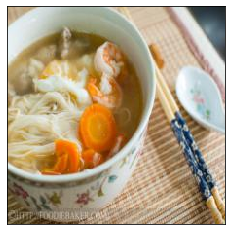

Image 3



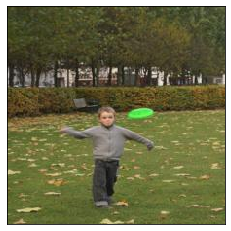

Image 10



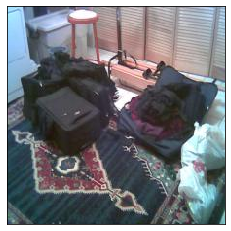

Image 5



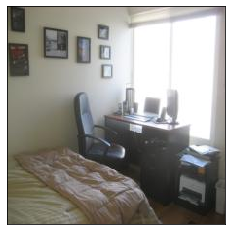

Image 2



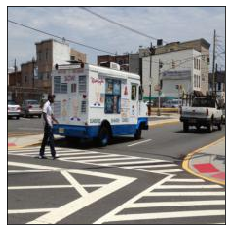

Image 9



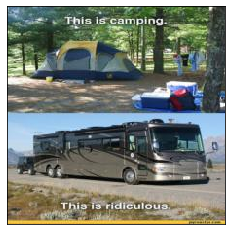

Image 18



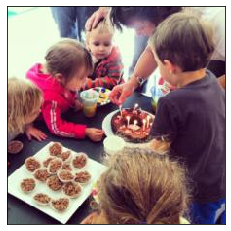

Image 17



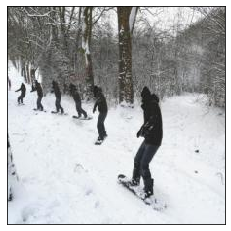

Image 14



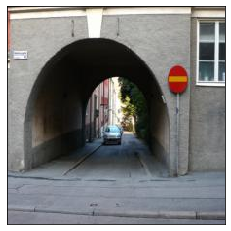

Image 12



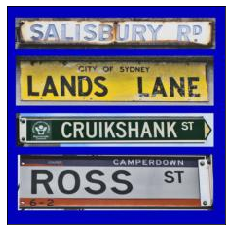

Image 8



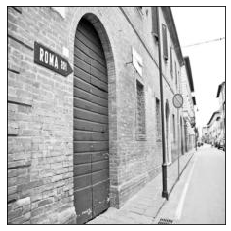

Image 6



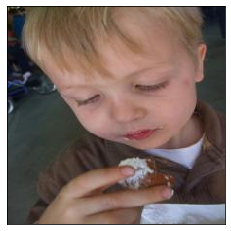

Image 15



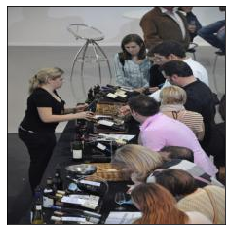

Image 0



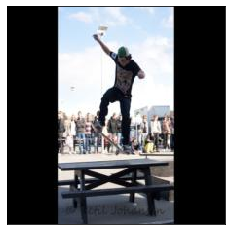

Image 4



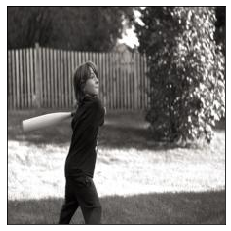

Image 19



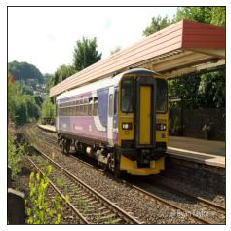

Image 13



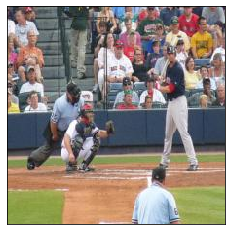

Image 11



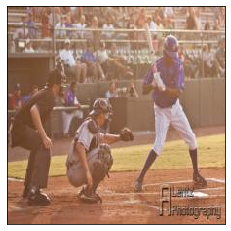

Image 16



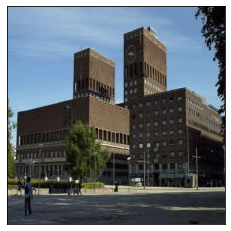

Image 7



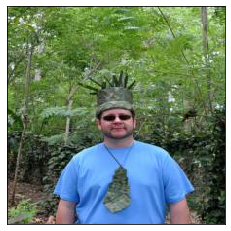

In [612]:
target_index = 1
# print(guesses[target_index])
index_guesses = GetClosestTwenty(GetImagesWithTag(guesses[target_index], tag_data[1]), feature_data, test_full_feature_data[target_index])
lib.DisplayImages(index_guesses, 'train')

In [645]:
# Use the above functions to generate a list of submission guesses
# print(full_feature_data[0])
knn_classifier = KNeighborsClassifier(n_neighbors=13)
knn_classifier.fit(full_feature_data, tag_label_data)
guesses = CheckTestAccuracy(knn_classifier, 2000, test_full_feature_data)
guess_list = []
for i in range(2000):
    ave_guess_vector = GetAverage(GetImagesWithTag(guesses[i], tag_data[0]), feature_data)
    index_guesses = GetClosestTwenty(GetImagesWithTag(guesses[i], tag_data[1]), feature_data, ave_guess_vector)
    guess_list.append(index_guesses)

Guess Progress: 0/2000
Guess Progress: 50/2000
Guess Progress: 100/2000
Guess Progress: 150/2000
Guess Progress: 200/2000
Guess Progress: 250/2000
Guess Progress: 300/2000
Guess Progress: 350/2000
Guess Progress: 400/2000
Guess Progress: 450/2000
Guess Progress: 500/2000
Guess Progress: 550/2000
Guess Progress: 600/2000
Guess Progress: 650/2000
Guess Progress: 700/2000
Guess Progress: 750/2000
Guess Progress: 800/2000
Guess Progress: 850/2000
Guess Progress: 900/2000
Guess Progress: 950/2000
Guess Progress: 1000/2000
Guess Progress: 1050/2000
Guess Progress: 1100/2000
Guess Progress: 1150/2000
Guess Progress: 1200/2000
Guess Progress: 1250/2000
Guess Progress: 1300/2000
Guess Progress: 1350/2000
Guess Progress: 1400/2000
Guess Progress: 1450/2000
Guess Progress: 1500/2000
Guess Progress: 1550/2000
Guess Progress: 1600/2000
Guess Progress: 1650/2000
Guess Progress: 1700/2000
Guess Progress: 1750/2000
Guess Progress: 1800/2000
Guess Progress: 1850/2000
Guess Progress: 1900/2000
Guess Pro

In [646]:
import time
# dic = {"John": "john@example.com", "Mary": "mary@example.com"} #dictionary
count = 0
result_dic = {}
start_time = time.time()

for i in range(2000):
    desc_test_name = str(i) + '.txt'
    top_20_imgs = guess_list[i]
    result_dic[desc_test_name] = top_20_imgs
    
    if count % 50 == 0:
        print('Progress: ' + str(count) + '/' + str(2000))
    count += 1
    
print(str(time.time() - start_time) + ' seconds')

Progress: 0/2000
Progress: 50/2000
Progress: 100/2000
Progress: 150/2000
Progress: 200/2000
Progress: 250/2000
Progress: 300/2000
Progress: 350/2000
Progress: 400/2000
Progress: 450/2000
Progress: 500/2000
Progress: 550/2000
Progress: 600/2000
Progress: 650/2000
Progress: 700/2000
Progress: 750/2000
Progress: 800/2000
Progress: 850/2000
Progress: 900/2000
Progress: 950/2000
Progress: 1000/2000
Progress: 1050/2000
Progress: 1100/2000
Progress: 1150/2000
Progress: 1200/2000
Progress: 1250/2000
Progress: 1300/2000
Progress: 1350/2000
Progress: 1400/2000
Progress: 1450/2000
Progress: 1500/2000
Progress: 1550/2000
Progress: 1600/2000
Progress: 1650/2000
Progress: 1700/2000
Progress: 1750/2000
Progress: 1800/2000
Progress: 1850/2000
Progress: 1900/2000
Progress: 1950/2000
0.003988504409790039 seconds


In [647]:
# Reference: https://pythonspot.com/save-a-dictionary-to-a-file/
import csv

w = csv.writer(open("submission2.csv", "w", newline=''))
w.writerow(["Descritpion_ID", "Top_20_Image_IDs"])
for key, val in result_dic.items():
    w.writerow([key, val])

In [608]:
print(len(guesses))

2000
